In [133]:
import os
import sys
from glob import glob
import io
import wave
from itertools import cycle
from scipy.stats import spearmanr
from scipy.stats import ttest_ind

import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns

import librosa
import librosa.display

import IPython.display as ipd


sns.set_theme(style="white", palette=None)
color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]
color_cycle = cycle(plt.rcParams["axes.prop_cycle"].by_key()["color"])

## Loading Pump and Valve Sound Files

In [2]:
current_dir = os.getcwd()

In [3]:
pump_audio_files_0db = glob(current_dir + "/data/pump_0_db/*/*/*.wav")
pump_audio_files_pos_6db = glob(current_dir + "/data/pump_neg_6_db/*/*/*.wav")
pump_audio_files_neg_6db = glob(current_dir + "/data/pump_pos_6_db/*/*/*.wav")
pump_audio_files = pump_audio_files_0db + pump_audio_files_pos_6db + pump_audio_files_neg_6db

valve_audio_files_0db = glob(current_dir + "/data/valve_0_db/*/*/*.wav")
valve_audio_files_pos_6db = glob(current_dir + "/data/valve_neg_6_db/*/*/*.wav")
valve_audio_files_neg_6db = glob(current_dir + "/data/valve_pos_6_db/*/*/*.wav")
valve_audio_files = valve_audio_files_0db + valve_audio_files_pos_6db + valve_audio_files_neg_6db

In [4]:
pump_normal_audio_files = glob(current_dir + "/data/pump_*/*/normal/*.wav")
pump_abnormal_audio_files = glob(current_dir + "/data/pump_*/*/abnormal/*.wav")
sample_pump_normal_file = pump_normal_audio_files[30]
sample_pump_abnormal_file = pump_abnormal_audio_files[30]

valve_normal_audio_files = glob(current_dir + "/data/valve_*/*/normal/*.wav")
valve_abnormal_audio_files = glob(current_dir + "/data/valve_*/*/abnormal/*.wav")
sample_valve_normal_file = valve_normal_audio_files[30]
sample_valve_abnormal_file = valve_abnormal_audio_files[30]

In [5]:
len(pump_abnormal_audio_files)

1368

In [6]:
len(pump_normal_audio_files)

11247

In [7]:
len(valve_abnormal_audio_files)

1437

In [8]:
len(valve_normal_audio_files)

11073

In [9]:
# Play audio file
ipd.Audio(sample_pump_normal_file)

In [10]:
ipd.Audio(sample_pump_abnormal_file)

In [11]:
ipd.Audio(sample_valve_normal_file)

In [12]:
ipd.Audio(sample_valve_abnormal_file)

In [13]:
print(len(pump_audio_files), pump_audio_files[0])

12615 /Users/jorgebonilla/Documents/Education/Graduate/Berkeley/Courses/Capstone/keyword_spotting/data/pump_0_db/id_00/abnormal/00000059.wav


In [14]:
test = pump_audio_files[0].split("/")
print(test)

['', 'Users', 'jorgebonilla', 'Documents', 'Education', 'Graduate', 'Berkeley', 'Courses', 'Capstone', 'keyword_spotting', 'data', 'pump_0_db', 'id_00', 'abnormal', '00000059.wav']


In [15]:
test[-2]

'abnormal'

In [16]:
def load_audio_files(paths, label):
    audio_files = []
    labels = []
    for audio_file_path in paths:
        classification = audio_file_path.split("/")[-2]
        raw_audio, sample_rate = librosa.load(audio_file_path, sr=None)
        audio_files.append(raw_audio)
        labels.append(1 if classification == "abnormal" else 0)
    return audio_files, labels, sample_rate

In [17]:
# Load the datasets
pump_normal_audio, pump_normal_labels, sample_rate_normal_pump = load_audio_files(pump_normal_audio_files, label=0)
pump_abnormal_audio, pump_abnormal_labels, sample_rate_abnormal_pump = load_audio_files(pump_abnormal_audio_files, label=1)

valve_normal_audio, valve_normal_labels, sample_rate_normal_valve = load_audio_files(valve_normal_audio_files, label=0)
valve_abnormal_audio, valve_abnormal_labels, sample_rate_abnormal_valve = load_audio_files(valve_abnormal_audio_files, label=1)

## Exploratory Data Analysis

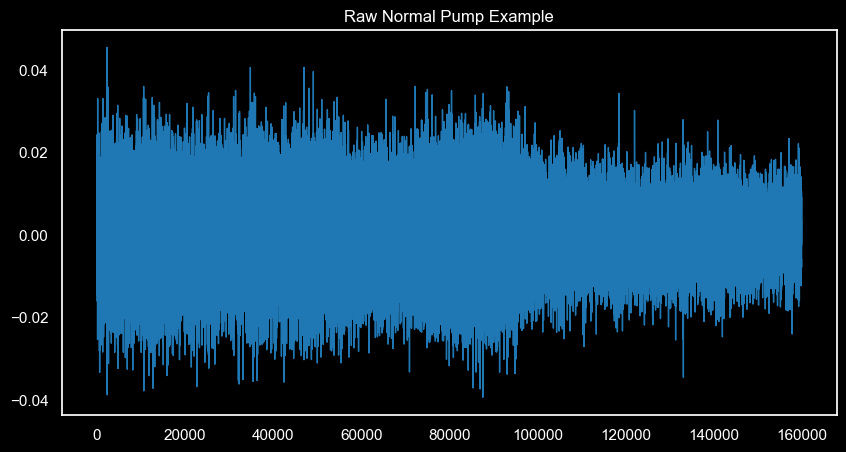

In [18]:
plt.style.use('dark_background')

pd.Series(pump_normal_audio[0]).plot(figsize=(10, 5),
                  lw=1,
                  title='Raw Normal Pump Example',
                 color=color_pal[0])
plt.show()

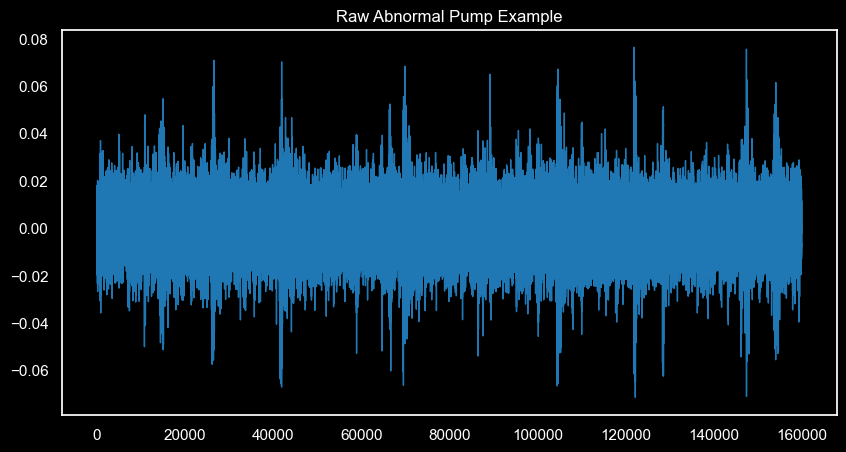

In [19]:
plt.style.use('dark_background')

pd.Series(pump_abnormal_audio[0]).plot(figsize=(10, 5),
                  lw=1,
                  title='Raw Abnormal Pump Example',
                 color=color_pal[0])
plt.show()

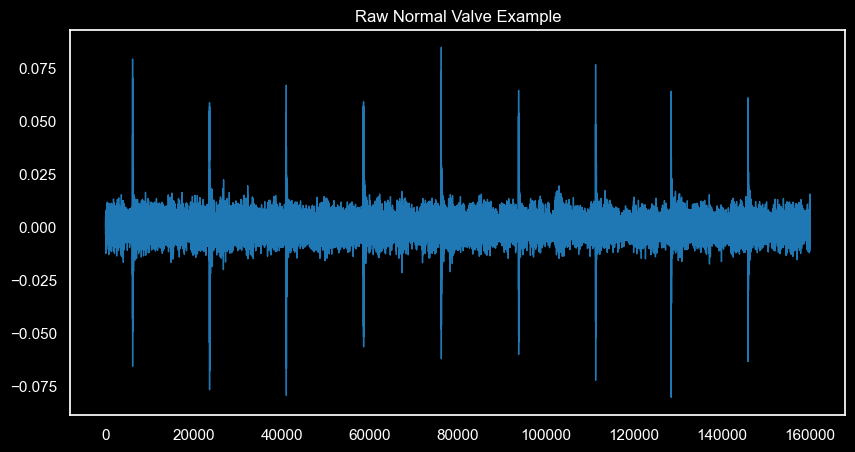

In [20]:
plt.style.use('dark_background')

pd.Series(valve_normal_audio[0]).plot(figsize=(10, 5),
                  lw=1,
                  title='Raw Normal Valve Example',
                 color=color_pal[0])
plt.show()

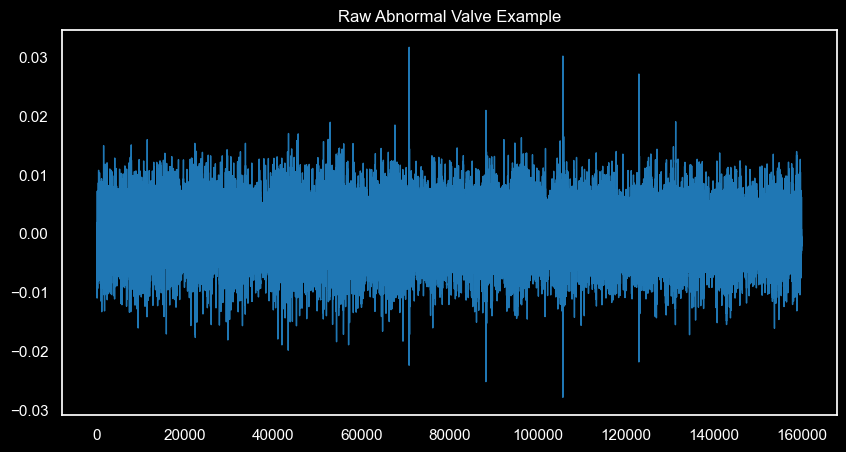

In [21]:
plt.style.use('dark_background')

pd.Series(valve_abnormal_audio[0]).plot(figsize=(10, 5),
                  lw=1,
                  title='Raw Abnormal Valve Example',
                 color=color_pal[0])
plt.show()

# Spectrograms for Pumps

In [22]:
# Short-time Fourier transformation (stft) to the data to generate the spectrogram
D_transform_pump_normal = librosa.stft(pump_normal_audio[0])

# Amplitude to db transformation
S_db_pump_normal = librosa.amplitude_to_db(np.abs(D_transform_pump_normal), ref=np.max)
S_db_pump_normal.shape

(1025, 313)

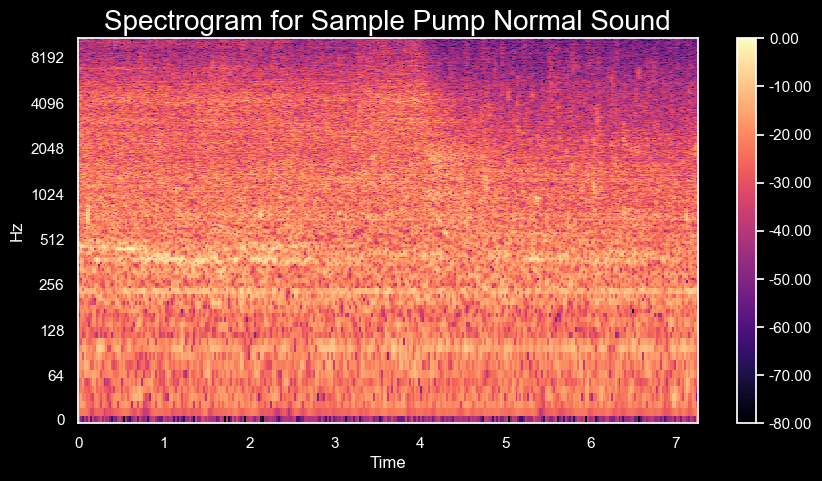

In [23]:
# Plot the transformed audio data
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db_pump_normal,
                              x_axis="time",
                              y_axis="log",
                              ax=ax)

ax.set_title("Spectrogram for Sample Pump Normal Sound", fontsize=20)
fig.colorbar(img, ax=ax, format=f"%0.2f")
plt.show()

In [24]:
# Short-time Fourier transformation (stft) to the data to generate the spectrogram
D_transform_pump_abnormal = librosa.stft(pump_abnormal_audio[0])

# Amplitude to db transformation
S_db_pump_abnormal = librosa.amplitude_to_db(np.abs(D_transform_pump_abnormal), ref=np.max)
S_db_pump_abnormal.shape

(1025, 313)

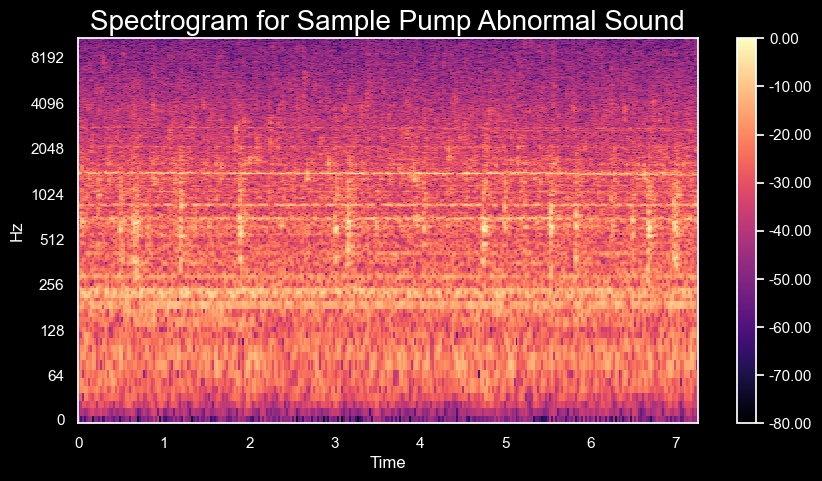

In [25]:
# Plot the transformed audio data
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db_pump_abnormal,
                              x_axis="time",
                              y_axis="log",
                              ax=ax)

ax.set_title("Spectrogram for Sample Pump Abnormal Sound", fontsize=20)
fig.colorbar(img, ax=ax, format=f"%0.2f")
plt.show()

# Mel Spectrograms for Pumps

In [27]:
S_pump_normal = librosa.feature.melspectrogram(y=pump_normal_audio[0],
                                                sr=sample_rate_normal_pump,
                                                n_mels=128*2,)
S_pump_normal.shape

(256, 313)

In [28]:
S_db_mel_pump_normal = librosa.amplitude_to_db(S_pump_normal, ref=np.max)

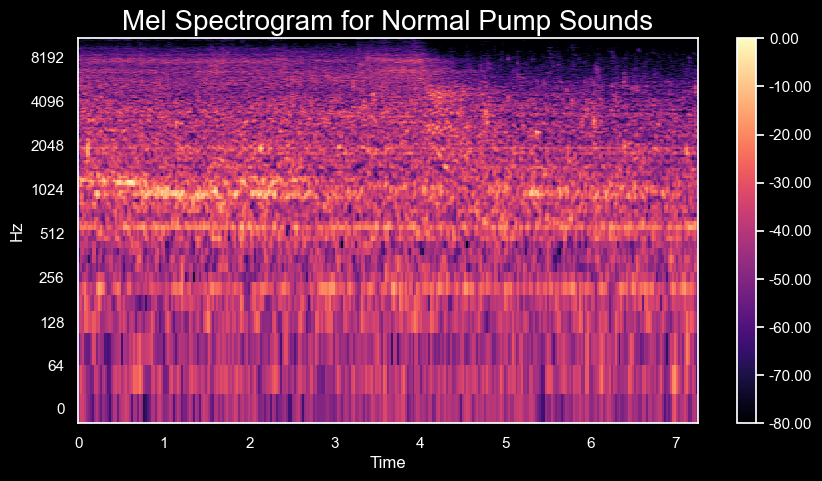

In [29]:
# Plot the melodic spectrogram
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db_mel_pump_normal,
                              x_axis="time",
                              y_axis="log",
                              ax=ax)

ax.set_title("Mel Spectrogram for Normal Pump Sounds", fontsize=20)
fig.colorbar(img, ax=ax, format=f"%0.2f")
plt.show()

In [30]:
S_pump_abnormal = librosa.feature.melspectrogram(y=pump_abnormal_audio[0],
                                                sr=sample_rate_abnormal_pump,
                                                n_mels=128*2,)
S_pump_abnormal.shape

(256, 313)

In [31]:
S_db_mel_pump_abnormal = librosa.amplitude_to_db(S_pump_abnormal, ref=np.max)

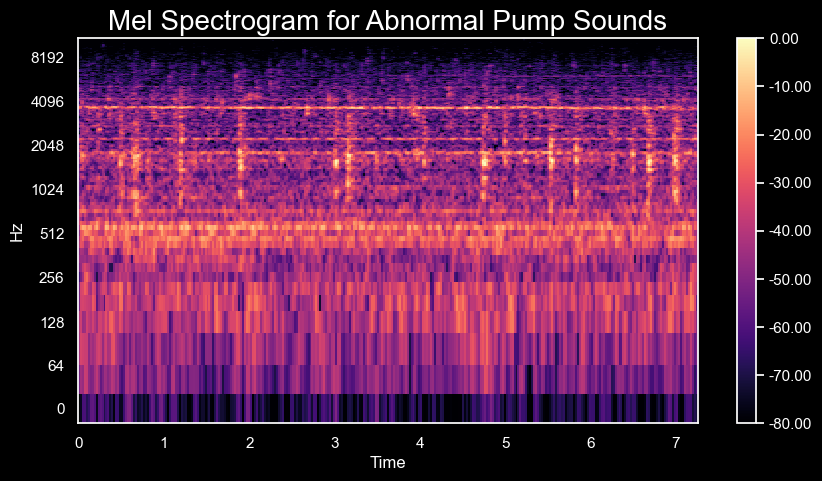

In [32]:
# Plot the melodic spectrogram
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db_mel_pump_abnormal,
                              x_axis="time",
                              y_axis="log",
                              ax=ax)

ax.set_title("Mel Spectrogram for Abnormal Pump Sounds", fontsize=20)
fig.colorbar(img, ax=ax, format=f"%0.2f")
plt.show()

# Spectrograms for Valves

In [33]:
# Short-time Fourier transformation (stft) to the data to generate the spectrogram
D_transform_valve_normal = librosa.stft(valve_normal_audio[0])

# Amplitude to db transformation
S_db_valve_normal = librosa.amplitude_to_db(np.abs(D_transform_valve_normal), ref=np.max)
S_db_valve_normal.shape

(1025, 313)

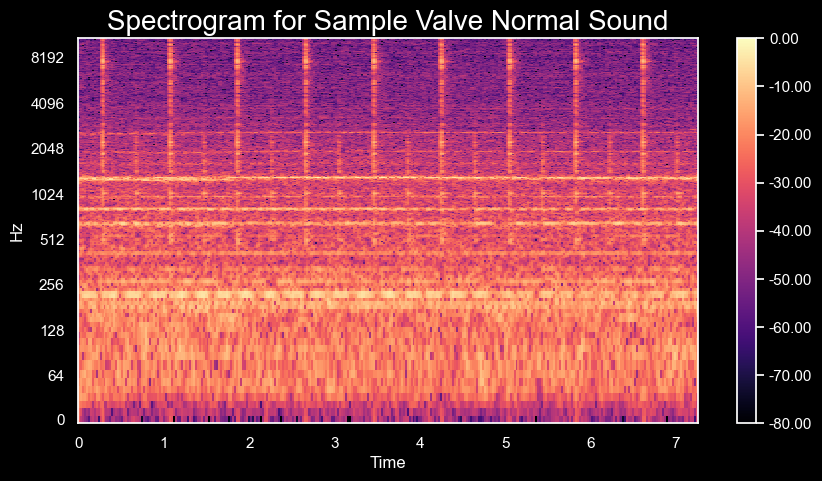

In [34]:
# Plot the transformed audio data
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db_valve_normal,
                              x_axis="time",
                              y_axis="log",
                              ax=ax)

ax.set_title("Spectrogram for Sample Valve Normal Sound", fontsize=20)
fig.colorbar(img, ax=ax, format=f"%0.2f")
plt.show()

In [36]:
# Short-time Fourier transformation (stft) to the data to generate the spectrogram
D_transform_valve_abnormal = librosa.stft(valve_abnormal_audio[0])

# Amplitude to db transformation
S_db_valve_abnormal = librosa.amplitude_to_db(np.abs(D_transform_valve_abnormal), ref=np.max)
S_db_valve_abnormal.shape

(1025, 313)

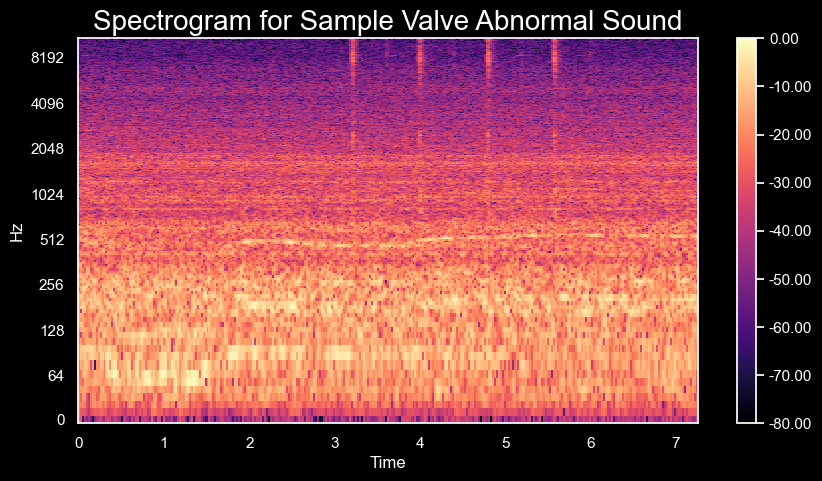

In [37]:
# Plot the transformed audio data
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db_valve_abnormal,
                              x_axis="time",
                              y_axis="log",
                              ax=ax)

ax.set_title("Spectrogram for Sample Valve Abnormal Sound", fontsize=20)
fig.colorbar(img, ax=ax, format=f"%0.2f")
plt.show()

In [38]:
S_valve_normal = librosa.feature.melspectrogram(y=valve_normal_audio[0],
                                                sr=sample_rate_normal_valve,
                                                n_mels=128*2,)
S_valve_normal.shape

(256, 313)

In [39]:
S_db_mel_valve_normal = librosa.amplitude_to_db(S_valve_normal, ref=np.max)

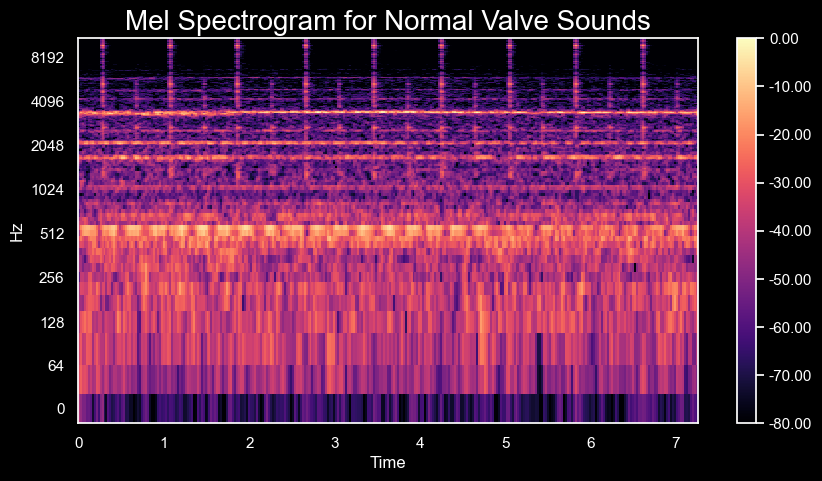

In [40]:
# Plot the melodic spectrogram
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db_mel_valve_normal,
                              x_axis="time",
                              y_axis="log",
                              ax=ax)

ax.set_title("Mel Spectrogram for Normal Valve Sounds", fontsize=20)
fig.colorbar(img, ax=ax, format=f"%0.2f")
plt.show()

In [42]:
S_valve_abnormal = librosa.feature.melspectrogram(y=valve_abnormal_audio[0],
                                                sr=sample_rate_abnormal_valve,
                                                n_mels=128*2,)
S_valve_abnormal.shape

(256, 313)

In [43]:
S_db_mel_valve_abnormal = librosa.amplitude_to_db(S_valve_abnormal, ref=np.max)

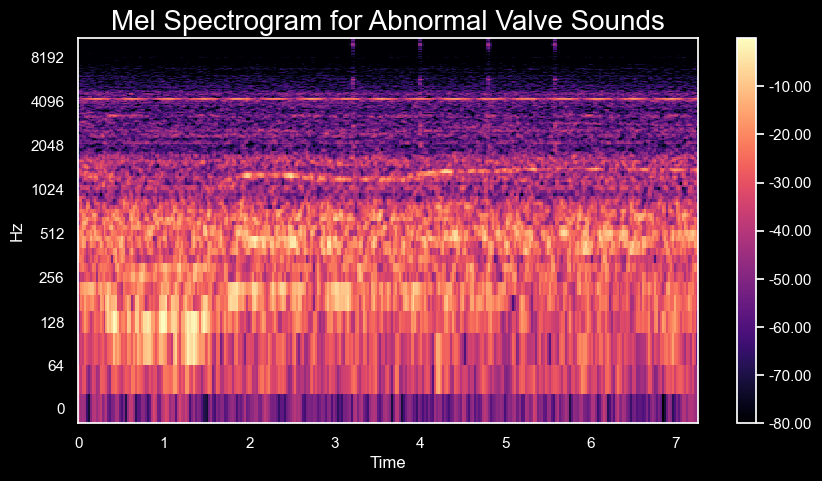

In [44]:
# Plot the melodic spectrogram
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db_mel_valve_abnormal,
                              x_axis="time",
                              y_axis="log",
                              ax=ax)

ax.set_title("Mel Spectrogram for Abnormal Valve Sounds", fontsize=20)
fig.colorbar(img, ax=ax, format=f"%0.2f")
plt.show()

# Feature Engineering

### Mel-Frequency Cepstrum Coefficients
In sound processing, the mel-frequency cepstrum (MFC) is a representation of the short-term power spectrum of a sound, based on a linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency.

We traditionally take the first 13 coefficients as they have the most relevant information. Source: https://www.youtube.com/watch?v=4_SH2nfbQZ8

### Temporal Features

### Spectral Features

In [51]:
def extract_mfccs(raw_audio, sample_rate, n_mfcc=13):
    # Extract the mfccs as numpy arrays
    mfccs = librosa.feature.mfcc(y=raw_audio, sr=sample_rate, n_mfcc=n_mfcc)

    # Find the average coefficient accross time of the processed audio file in the MFCC sequence
    mfccs_processed = np.mean(mfccs.T, axis=0)
    
    return mfccs_processed

In [56]:
def extract_temporal_features(raw_audio):

    # the rate at which a signal changes from positive to zero to negative or from negative to zero to positive.
    zero_crossing_rate=librosa.feature.zero_crossing_rate(raw_audio)[0]
    
    # Bounded-lag auto-correlation
    # The autocorrelation is useful for finding repeated patterns in a signal.
    # For example, at short lags, the autocorrelation can tell us something about the signal's fundamental frequency.
    # For longer lags, the autocorrelation may tell us something about the tempo of a musical signal.
    autocorrelation = librosa.autocorrelate(raw_audio)
    
    return np.mean(zero_crossing_rate), np.mean(autocorrelation)

In [57]:
def extract_spectral_features(raw_audio, sample_rate):
    
    spectral_centroids = librosa.feature.spectral_centroid(y=raw_audio, sr=sample_rate)[0]
    spectral_rollof = librosa.feature.spectral_rolloff(y=raw_audio, sr=sample_rate)[0]
    spectral_contrast = librosa.feature.spectral_contrast(y=raw_audio, sr=sample_rate)[0]
    
    return np.mean(spectral_centroids), np.mean(spectral_rollof), np.mean(spectral_contrast)

In [58]:
def extract_features(audio_data, sample_rate):
    
    features = []
    
    for audio in audio_data:

        mfccs = extract_mfccs(audio, sample_rate)
        temporal_features = extract_temporal_features(audio)
        spectral_features = extract_spectral_features(audio, sample_rate)
        
        all_features = np.concatenate([mfccs, spectral_features, temporal_features])
        features.append(all_features)
    
    return np.array(features)

In [59]:
# Extract features for both normal and abnormal data
normal_pump_audio_features = extract_features(pump_normal_audio, sample_rate_normal_pump)
abnormal_pump_audio_features = extract_features(pump_abnormal_audio, sample_rate_abnormal_pump)

In [60]:
# Traditionally the first 13 MFCC's are the most descriptive in signal processing
n_mfcc = 13
mfcc_labels = [f"MFCC_{i+1}" for i in range(n_mfcc)]

# 3 spectral features
spectral_labels = ['Spectral Centroid', 'Spectral Rolloff', 'Spectral Contrast']

# You have 2 temporal features
temporal_labels = ['Zero Crossing Rate', 'Autocorrelation']

# Combine all feature labels into a single list
feature_names = mfcc_labels + spectral_labels + temporal_labels

feature_names

['MFCC_1',
 'MFCC_2',
 'MFCC_3',
 'MFCC_4',
 'MFCC_5',
 'MFCC_6',
 'MFCC_7',
 'MFCC_8',
 'MFCC_9',
 'MFCC_10',
 'MFCC_11',
 'MFCC_12',
 'MFCC_13',
 'Spectral Centroid',
 'Spectral Rolloff',
 'Spectral Contrast',
 'Zero Crossing Rate',
 'Autocorrelation']

In [72]:
normal_pump_audio_features.shape[1]

18

In [97]:
def plot_feature_distributions(normal_features, abnormal_features, feature_names):
    
    number_of_features = normal_features.shape[1]

    m_rows = int(normal_features.shape[1] / 2)
    n_cols = 2
    # Feature Name custom index
    f_idx = 0
    
    fig, axs = plt.subplots(m_rows, n_cols, figsize=(20, 30))

    for row in range(m_rows):
        for col in range(n_cols):
            
            sns.histplot(normal_features[:, f_idx], color="blue", label="Nomral", kde=True, ax=axs[row, col])
            sns.histplot(abnormal_features[:, f_idx], color="red", label="Abnormal", kde=True, ax=axs[row, col])
            axs[row, col].set_title(f"Distribution of {feature_names[f_idx]}")
            axs[row, col].legend()
            f_idx += 1

    plt.tight_layout()
    plt.show()
    

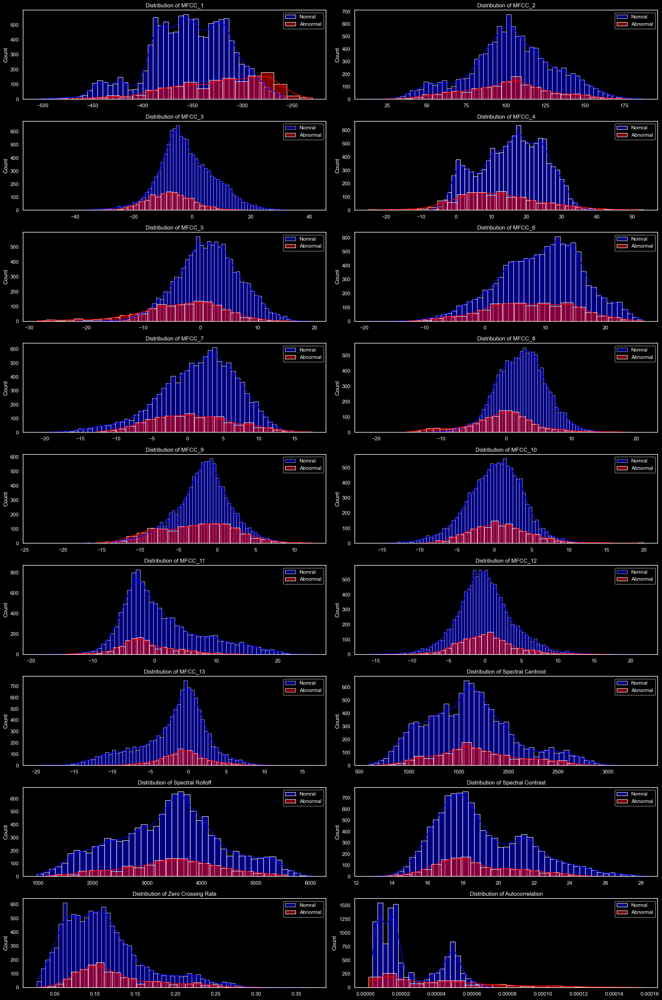

In [98]:
# Plotting
plot_feature_distributions(normal_pump_audio_features, abnormal_pump_audio_features, feature_names)

In [66]:
# Boxplot for visualizating the distributions
def plot_feature_boxplots(normal_features, abnormal_features, feature_names):
    
    number_of_features = normal_features.shape[1]
    
    fig = plt.figure(figsize=(10, 2*number_of_features))

    for i in range(number_of_features):
        ax = fig.add_subplot(number_of_features, 1, i + 1)
        ax.boxplot([normal_features[:, i], abnormal_features[:, i]], labels=["Normal", "Abnormal"])
        ax.set_title(f"Boxplot of {feature_names[i]}")

    plt.tight_layout()
    plt.show()

In [104]:
# Boxplots for features
def plot_feature_boxplots(normal_features, abnormal_features, feature_names):
    
    number_of_features = normal_features.shape[1]

    m_rows = int(normal_features.shape[1] / 2)
    n_cols = 2
    # Feature Name custom index
    f_idx = 0
    
    fig, axes = plt.subplots(m_rows, n_cols, figsize=(20, 30))

    for row in range(m_rows):
        for col in range(n_cols):
            
            axes[row, col].boxplot([normal_features[:, f_idx], abnormal_features[:, f_idx]], labels=["Normal", "Abnormal"])
            axes[row, col].set_title(f"Boxplot of {feature_names[f_idx]}")
            f_idx += 1

    plt.tight_layout()
    plt.show()
    

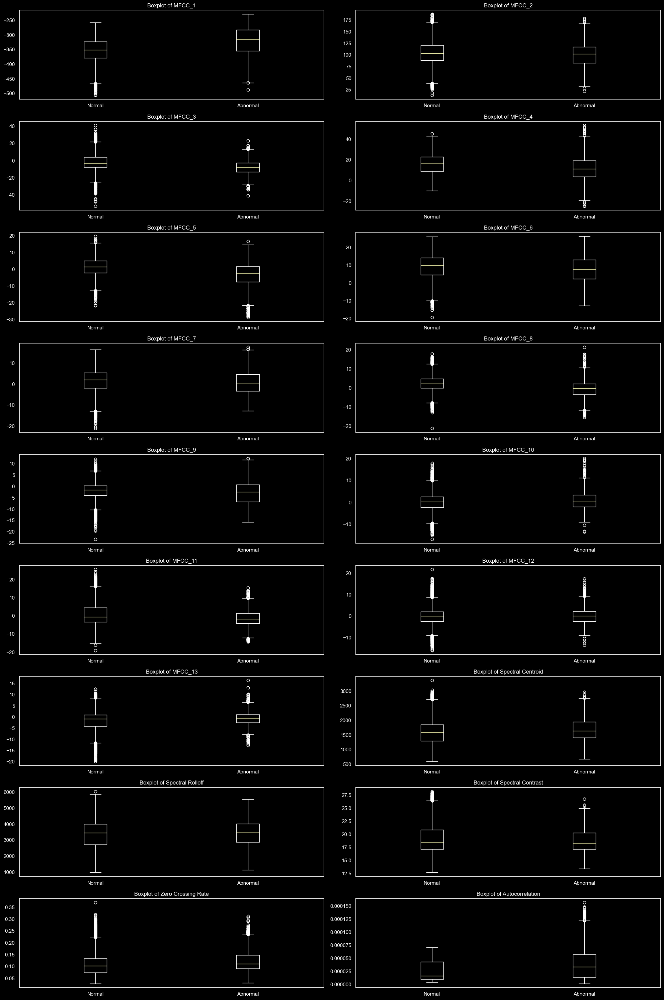

In [105]:
plot_feature_boxplots(normal_pump_audio_features, abnormal_pump_audio_features, feature_names)

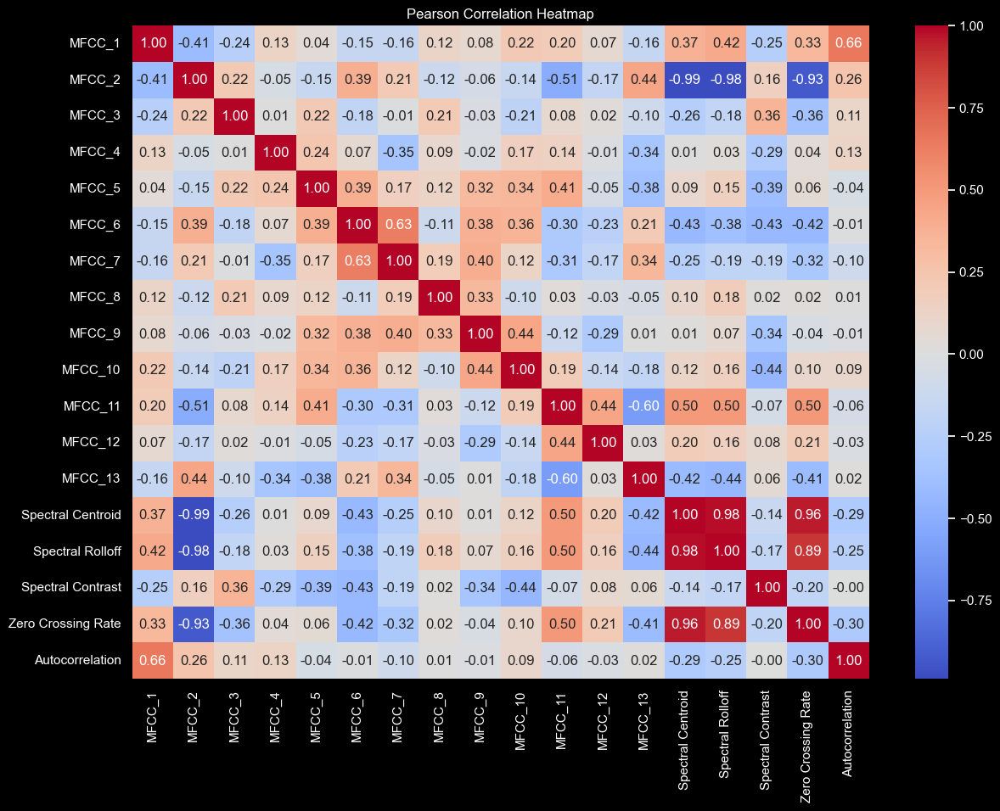

In [107]:
# Must have the same number of feautres
features = np.concatenate((normal_pump_audio_features, abnormal_pump_audio_features))

# Calculate the Pearson product-moment correlation coefficients: distributions look fairly normal
corr_matrix = np.corrcoef(features.T)  # Transpose features to get place them as columns

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', xticklabels=feature_names, yticklabels=feature_names)
plt.title('Pearson Correlation Heatmap')
plt.show()

In [116]:
type(normal_pump_audio_features)

numpy.ndarray

In [117]:
normal_pump_audio_features.T

array([[-2.72653809e+02, -2.89950806e+02, -3.20723877e+02, ...,
        -3.89450104e+02, -3.92110809e+02, -3.76262817e+02],
       [ 8.10868225e+01,  1.07177689e+02,  9.20775909e+01, ...,
         1.05099419e+02,  9.76580353e+01,  8.43282547e+01],
       [-1.80023594e+01, -4.97206163e+00,  2.46703892e+01, ...,
        -8.41683674e+00, -9.94810772e+00, -6.80111361e+00],
       ...,
       [ 1.80912152e+01,  1.83142233e+01,  1.90854854e+01, ...,
         1.65679927e+01,  1.60513097e+01,  1.58182357e+01],
       [ 1.75116688e-01,  9.17625549e-02,  8.15055287e-02, ...,
         1.18689784e-01,  1.31406936e-01,  1.42916646e-01],
       [ 3.53173001e-05,  5.14526958e-05,  4.44151953e-05, ...,
         6.61801161e-06,  5.76158061e-06,  6.61630760e-06]])

In [118]:
features = np.concatenate((normal_pump_audio_features, abnormal_pump_audio_features))

In [119]:
df = pd.DataFrame(features, columns=feature_names)

In [120]:
df.head()

,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,MFCC_10,MFCC_11,MFCC_12,MFCC_13,Spectral Centroid,Spectral Rolloff,Spectral Contrast,Zero Crossing Rate,Autocorrelation
0,-272.653809,81.086823,-18.002359,17.227421,-8.489776,3.649842,-0.514643,-1.837316,-1.649868,-3.538783,-4.754708,-0.400892,-1.018150,2026.834640,3944.563698,18.091215,0.175117,0.000035
1,-289.950806,107.177689,-4.972062,23.308102,1.572017,11.293457,1.652339,3.441108,-0.964211,0.282727,-3.051526,-1.196389,-0.250094,1517.181869,3287.265375,18.314223,0.091763,0.000051
2,-320.723877,92.077591,24.670389,14.716551,5.236410,13.501698,8.314373,9.045591,4.894711,1.627821,-0.127330,0.588100,2.269722,1714.290742,4314.821286,19.085485,0.081506,0.000044
3,-306.583649,122.353188,-7.235127,22.872623,-1.618554,11.444311,0.192827,6.438015,-1.684120,0.725484,-5.250217,-1.114498,1.499333,1303.829729,2758.386581,17.747022,0.079930,0.000048
4,-301.612823,96.829933,-2.796075,4.372369,-2.782143,6.229146,6.602062,5.726280,0.478941,-3.138225,-1.915767,3.675821,5.917063,1734.861897,3751.996805,21.680012,0.114345,0.000043


In [121]:
df.tail()

,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,MFCC_10,MFCC_11,MFCC_12,MFCC_13,Spectral Centroid,Spectral Rolloff,Spectral Contrast,Zero Crossing Rate,Autocorrelation
12610,-306.084900,56.705551,-10.831594,9.409151,2.931262,17.420242,7.447029,2.282569,-0.245451,1.997751,-3.063735,0.761368,0.507319,2451.053571,5000.399361,17.458075,0.209727,0.000024
12611,-298.907288,55.772091,-10.528910,5.386854,-1.144427,15.072450,3.840933,-2.189832,-3.195290,0.293161,-5.577154,-0.933315,-1.490460,2506.537162,5104.807308,16.405715,0.221926,0.000022
12612,-361.413177,92.068550,-6.620562,4.204634,7.245896,15.167161,7.181738,1.818254,1.017941,6.645023,-2.859211,-8.524650,-3.735103,1808.135207,3934.255192,16.909912,0.137642,0.000012
12613,-388.891083,109.519669,-10.222049,1.322456,4.500077,21.358068,12.529032,-1.525371,4.611914,3.921212,-3.083806,-4.114335,-3.310017,1537.457815,3189.871206,16.398882,0.123794,0.000009
12614,-351.323273,87.573418,-14.774282,6.520901,-0.704487,12.539222,5.550974,-0.796879,0.639851,7.412462,-1.426445,-4.654579,0.243441,1888.426987,3918.655152,16.210725,0.150066,0.000011


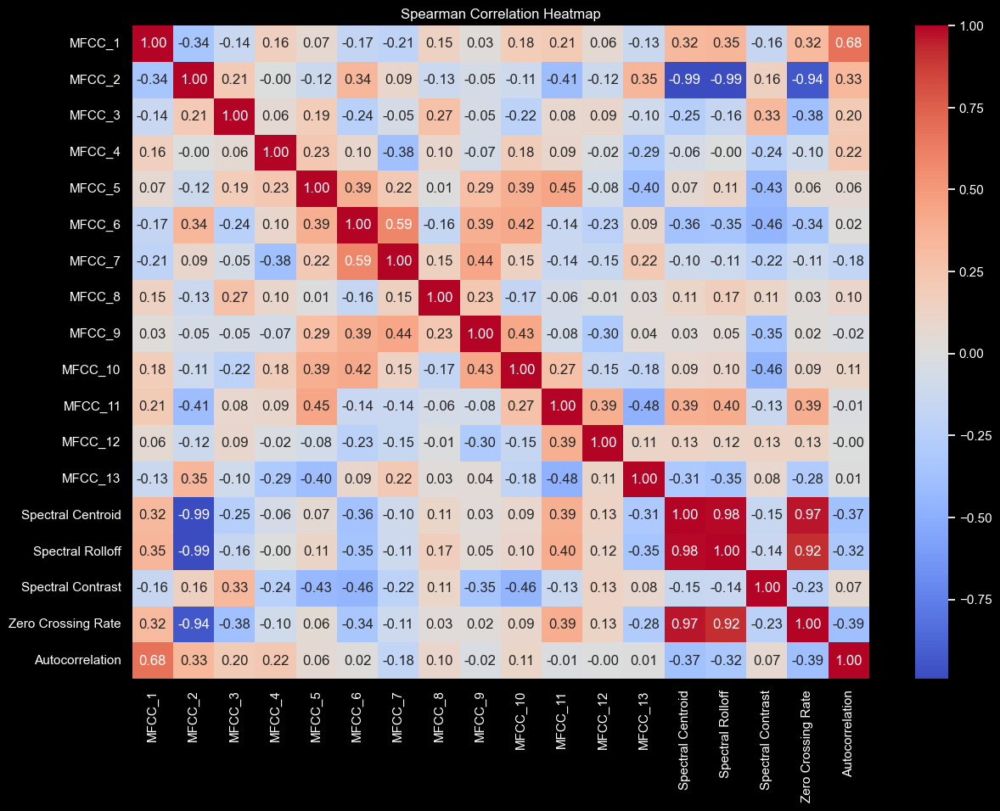

In [124]:
spearman_corr = df.corr(method = 'spearman')
plt.figure(figsize=(14, 10))
sns.heatmap(spearman_corr, annot=True, fmt='.2f', cmap='coolwarm', xticklabels=feature_names, yticklabels=feature_names)
plt.title('Spearman Correlation Heatmap')
plt.show()

# Statistical Analysis

In [129]:
# Statistics
for i in range(normal_pump_audio_features.shape[1]):
    normal_mean = np.mean(normal_pump_audio_features[:, i])
    normal_std = np.std(normal_pump_audio_features[:, i])
    abnormal_mean = np.mean(abnormal_pump_audio_features[:, i])
    abnormal_std = np.std(abnormal_pump_audio_features[:, i])
    feature = feature_names[i]

    print(feature)
    print(f"Normal - Mean: {normal_mean:.2f}, Std Dev: {normal_std:.2f}")
    print(f"Abnormal - Mean: {abnormal_mean:.2f}, Std Dev: {abnormal_std:.2f}")
    print(50*"=")
    print()

MFCC_1
Normal - Mean: -352.96, Std Dev: 40.93
Abnormal - Mean: -322.08, Std Dev: 47.25

MFCC_2
Normal - Mean: 103.96, Std Dev: 27.20
Abnormal - Mean: 100.85, Std Dev: 27.19

MFCC_3
Normal - Mean: -1.87, Std Dev: 9.52
Abnormal - Mean: -7.69, Std Dev: 7.88

MFCC_4
Normal - Mean: 15.68, Std Dev: 9.17
Abnormal - Mean: 12.14, Std Dev: 12.33

MFCC_5
Normal - Mean: 1.45, Std Dev: 5.38
Abnormal - Mean: -3.35, Std Dev: 7.41

MFCC_6
Normal - Mean: 9.36, Std Dev: 6.88
Abnormal - Mean: 7.62, Std Dev: 7.22

MFCC_7
Normal - Mean: 1.56, Std Dev: 5.46
Abnormal - Mean: 0.82, Std Dev: 5.60

MFCC_8
Normal - Mean: 2.39, Std Dev: 3.80
Abnormal - Mean: -0.58, Std Dev: 5.32

MFCC_9
Normal - Mean: -1.85, Std Dev: 3.73
Abnormal - Mean: -2.72, Std Dev: 5.02

MFCC_10
Normal - Mean: 0.16, Std Dev: 3.80
Abnormal - Mean: 1.01, Std Dev: 4.38

MFCC_11
Normal - Mean: 1.16, Std Dev: 6.41
Abnormal - Mean: -1.25, Std Dev: 4.65

MFCC_12
Normal - Mean: 0.05, Std Dev: 3.84
Abnormal - Mean: 0.23, Std Dev: 3.85

MFCC_13
Norma

# Statistical Significance Between Normal and Abnormal Sounds

Runing a t-test to determine whether the differences between the normal and abnormal sounds are statistically significant

## t-Test assumptions
While t-tests are relatively robust to deviations from assumptions, t-tests do assume that:

1. The data are continuous.
2. The sample data have been randomly sampled from a population.
3. There is homogeneity of variance (i.e., the variability of the data in each group is similar).
4. The distribution is approximately normal.
5. For two-sample t-tests, we must have independent samples. If the samples are not independent, then a paired t-test may be appropriate.



## Null Hypothesis
## $H_0$: $M_{normal}$ = $M_{abnormal}$

## Alternative Hypothesis
## $H_a$: $M_{normal}$ $\not=$ $M_{abnormal}$

Calculate the T-test for the means of two independent samples of scores.

This is a test for the null hypothesis that 2 independent samples have identical average (expected) values. This test assumes that the populations have identical variances by default.

In [142]:
# Two sample t-test for each variable 
for feature_type in range(normal_pump_audio_features.shape[1]):

    # Calculate t_statistic and p_value
    t_stat, p_val = ttest_ind(a=normal_pump_audio_features[:, feature_type],
                              b=abnormal_pump_audio_features[:, feature_type],
                              axis=0, # Compute row-wise against one another,
                              equal_var=True, # If True (default), perform a standard independent 2 sample test that assumes equal population variances [1]. If False, perform Welch’s t-test, which does not assume equal population variance [2].
                              nan_policy="propagate",
                              permutations=None, # Use the t-distribution to calculate p-value
                              random_state=None, # If seed is None (or np.random), the numpy.random.RandomState singleton is used.
                              alternative="two-sided", # ‘two-sided’: the means of the distributions underlying the samples are unequal.
                              trim=0,
                              keepdims=False)

    # Assuming you have a list of feature names
    feature_name = feature_names[feature_type]

    # Print the t-statistic and p-value for each feature
    print ("Standard Independent 2 Sample Test")
    print(f"Feature: {feature_name}:")
    print(f" T-Statistic = {t_stat:.5f}, P-Value (Scientific) = {p_val:.5g}, , P-Value (Decimal) = {p_val:.5f}")
    print(100*"=")
    print()

Standard Independent 2 Sample Test
Feature: MFCC_1:
 T-Statistic = -25.87996, P-Value (Scientific) = 6.1716e-144, , P-Value (Decimal) = 0.00000

Standard Independent 2 Sample Test
Feature: MFCC_2:
 T-Statistic = 3.98795, P-Value (Scientific) = 6.7022e-05, , P-Value (Decimal) = 0.00007

Standard Independent 2 Sample Test
Feature: MFCC_3:
 T-Statistic = 21.70481, P-Value (Scientific) = 1.3764e-102, , P-Value (Decimal) = 0.00000

Standard Independent 2 Sample Test
Feature: MFCC_4:
 T-Statistic = 12.94016, P-Value (Scientific) = 4.6637e-38, , P-Value (Decimal) = 0.00000

Standard Independent 2 Sample Test
Feature: MFCC_5:
 T-Statistic = 29.77765, P-Value (Scientific) = 2.3052e-188, , P-Value (Decimal) = 0.00000

Standard Independent 2 Sample Test
Feature: MFCC_6:
 T-Statistic = 8.74963, P-Value (Scientific) = 2.4104e-18, , P-Value (Decimal) = 0.00000

Standard Independent 2 Sample Test
Feature: MFCC_7:
 T-Statistic = 4.73199, P-Value (Scientific) = 2.2474e-06, , P-Value (Decimal) = 0.00000

In [143]:
# Perform Welch’s t-test, which does not assume equal population variance [2].
for feature_type in range(normal_pump_audio_features.shape[1]):

    # Calculate t_statistic and p_value
    t_stat, p_val = ttest_ind(a=normal_pump_audio_features[:, feature_type],
                              b=abnormal_pump_audio_features[:, feature_type],
                              axis=0, # Compute row-wise against one another,
                              equal_var=False, # If True (default), perform a standard independent 2 sample test that assumes equal population variances [1]. If False, perform Welch’s t-test, which does not assume equal population variance [2].
                              nan_policy="propagate",
                              permutations=None, # Use the t-distribution to calculate p-value
                              random_state=None, # If seed is None (or np.random), the numpy.random.RandomState singleton is used.
                              alternative="two-sided", # ‘two-sided’: the means of the distributions underlying the samples are unequal.
                              trim=0,
                              keepdims=False)

    # Assuming you have a list of feature names
    feature_name = feature_names[feature_type]

    # Print the t-statistic and p-value for each feature
    print ("Welch’s T-test")
    print(f"Feature: {feature_name}:")
    print(f" T-Statistic = {t_stat:.5f}, P-Value (Scientific) = {p_val:.5g}, , P-Value (Decimal) = {p_val:.5f}")
    print(100*"=")
    print()

Welch’s T-test
Feature: MFCC_1:
 T-Statistic = -23.12809, P-Value (Scientific) = 1.512e-102, , P-Value (Decimal) = 0.00000

Welch’s T-test
Feature: MFCC_2:
 T-Statistic = 3.98856, P-Value (Scientific) = 6.9269e-05, , P-Value (Decimal) = 0.00007

Welch’s T-test
Feature: MFCC_3:
 T-Statistic = 25.13592, P-Value (Scientific) = 1.6717e-120, , P-Value (Decimal) = 0.00000

Welch’s T-test
Feature: MFCC_4:
 T-Statistic = 10.29184, P-Value (Scientific) = 4.445e-24, , P-Value (Decimal) = 0.00000

Welch’s T-test
Feature: MFCC_5:
 T-Statistic = 23.23720, P-Value (Scientific) = 1.0628e-102, , P-Value (Decimal) = 0.00000

Welch’s T-test
Feature: MFCC_6:
 T-Statistic = 8.42131, P-Value (Scientific) = 7.8606e-17, , P-Value (Decimal) = 0.00000

Welch’s T-test
Feature: MFCC_7:
 T-Statistic = 4.63757, P-Value (Scientific) = 3.795e-06, , P-Value (Decimal) = 0.00000

Welch’s T-test
Feature: MFCC_8:
 T-Statistic = 20.03133, P-Value (Scientific) = 1.631e-79, , P-Value (Decimal) = 0.00000

Welch’s T-test
Feat